In [ ]:
!pip install yfinance pandas matplotlib numpy prophet

import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
import seaborn as sns
from scipy.stats import linregress
#from google.colab import files

This code downloads **1 year of historical stock data for NVIDIA (NVDA)** using the yfinance library, then **filters it to include only data from February 1, 2024 to January 31, 2025**. It ensures the 'Date' column is in datetime format and displays the first few rows of the filtered dataset. This is useful for performing CAPM or time-series analysis on a specific 1-year period.


In [3]:
# Download 1 year of historical stock data
stock = yf.Ticker("NVDA")
hist = stock.history(period="2y")
hist.reset_index(inplace=True)

# Filter the data for the specific date range
hist['Date'] = pd.to_datetime(hist['Date'])  # Ensure 'Date' column is datetime
filtered_data = hist[(hist['Date'] >= '2024-02-01') & (hist['Date'] <= '2025-01-31')]

# Display first few rows of filtered data
filtered_data.head()


,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
138,2024-02-01 00:00:00-05:00,62.072377,63.162895,61.622580,62.998966,369146000,0.0,0.0
139,2024-02-02 00:00:00-05:00,63.945537,66.570369,63.661663,66.130569,476578000,0.0,0.0
140,2024-02-05 00:00:00-05:00,68.194653,69.466090,67.175110,69.301163,680078000,0.0,0.0
141,2024-02-06 00:00:00-05:00,69.599029,69.722975,66.270516,68.192657,683111000,0.0,0.0
142,2024-02-07 00:00:00-05:00,68.288611,70.188766,67.569929,70.067818,495575000,0.0,0.0


This code retrieves **NVIDIA's financial statements**—Income Statement, Balance Sheet, and Cash Flow—from Yahoo Finance using yfinance, and then **saves each one as a separate CSV file**. These CSV files can then be used for **further analysis or Excel-based ratio calculations**.


In [4]:
income = stock.financials
balance = stock.balance_sheet
cashflow = stock.cashflow

#Save to CSV for Excel work
income.to_csv("income_statement.csv")
balance.to_csv("balance_sheet.csv")
cashflow.to_csv("cashflow_statement.csv")


In [5]:
# files.download("income_statement.csv")
# files.download("balance_sheet.csv")
# files.download("cashflow_statement.csv")


This code fetches **NVIDIA’s dividend payment history**, filters it to a custom date range (from **April 1, 2024 to March 31, 2025**), and saves the filtered data as a CSV file named `"dividend_history.csv"`. It also triggers the file download so you can use the dividend data directly in Excel for further analysis like **DPS or dividend yield**.


In [6]:
# Load the stock
stock = yf.Ticker("NVDA")

# Get all dividend history
dividends = stock.get_dividends()

# Convert to DataFrame and reset index
dividends_df = dividends.reset_index()
dividends_df.columns = ['Date', 'Dividend']

# Filter by date range
start_date = '2024-04-01'
end_date = '2025-03-31'
dividends_df_filtered = dividends_df[(dividends_df['Date'] >= start_date) & (dividends_df['Date'] <= end_date)]


# Save as CSV
dividends_df_filtered.to_csv("dividend_history.csv", index=False)

# Download the file
#files.download("dividend_history.csv")

Technical Analysis

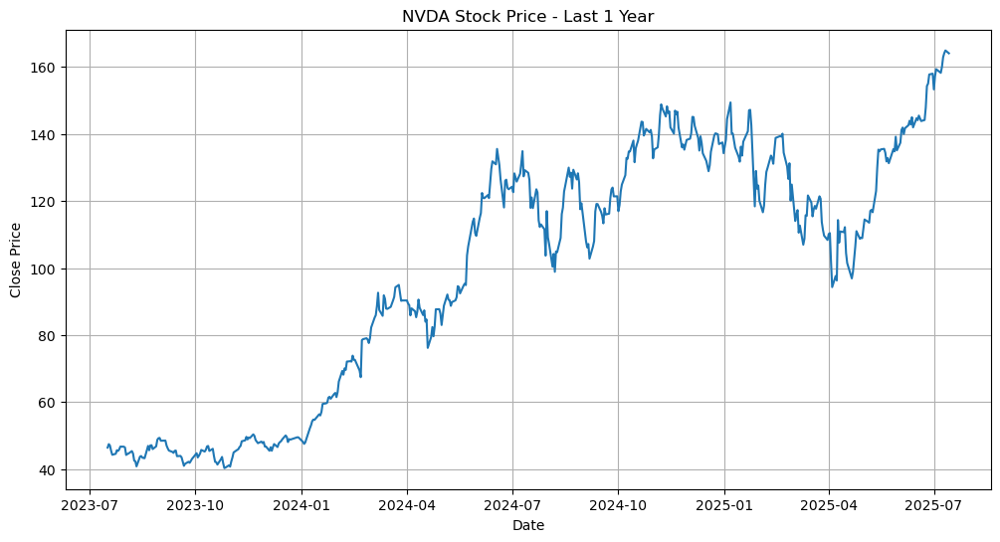

In [7]:
#Show Line Chart for Past 1 Year
plt.figure(figsize=(12,6))
plt.plot(hist['Date'], hist['Close'])
plt.title("NVDA Stock Price - Last 1 Year")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.grid()
plt.show()


Monte Carlo Simulation (100 runs, 30-day forecast)

Monte Carlo Simulation is a technique used to forecast the future stock price by simulating multiple possible outcomes based on historical data. In this case, it runs 100 simulations for the next 30 days using NVIDIA’s past returns and volatility. Each simulated path is generated using random values influenced by average daily return and standard deviation. This helps visualize the range of possible future stock prices, offering insights into potential risk and uncertainty rather than a single predicted value.


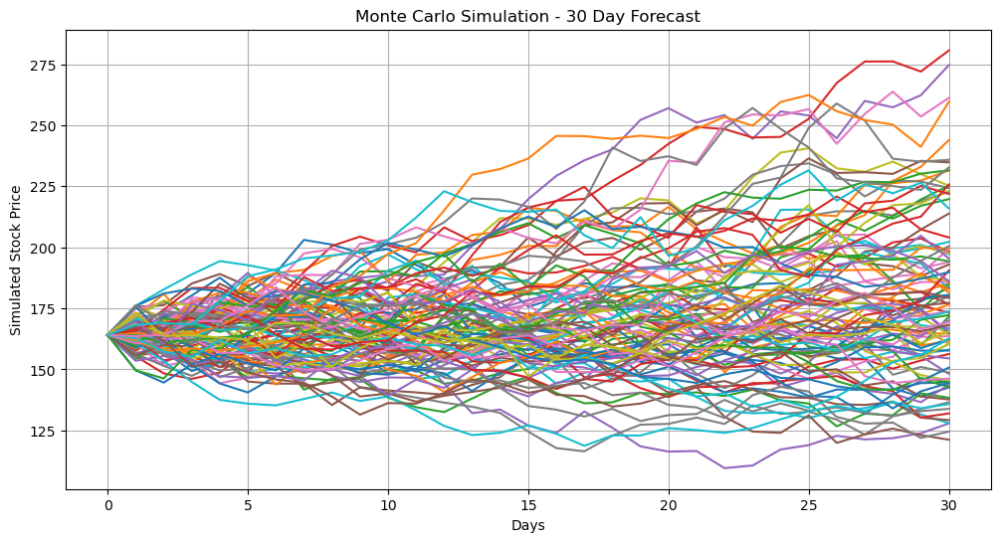

In [8]:
last_price = hist['Close'].iloc[-1]
daily_returns = hist['Close'].pct_change().dropna()
mu = daily_returns.mean()
sigma = daily_returns.std()

num_simulations = 100
num_days = 30

simulations = pd.DataFrame()

for sim in range(num_simulations):
    prices = [last_price]
    for d in range(num_days):
        price = prices[-1] * (1 + np.random.normal(mu, sigma))
        prices.append(price)
    simulations[sim] = prices

simulations.plot(figsize=(12,6), legend=False)
plt.title("Monte Carlo Simulation - 30 Day Forecast")
plt.xlabel("Days")
plt.ylabel("Simulated Stock Price")
plt.grid()
plt.show()


In [9]:
# Mean expected value at Day 30
expected_price = simulations.iloc[-1].mean()

# 95% confidence interval
ci_lower = simulations.iloc[-1].quantile(0.025)
ci_upper = simulations.iloc[-1].quantile(0.975)

print(f"Expected Price in 30 Days: ${expected_price:.2f}")
print(f"95% Confidence Interval: ${ci_lower:.2f} to ${ci_upper:.2f}")


Expected Price in 30 Days: $180.31
95% Confidence Interval: $127.92 to $260.47


**CAPM Calculation(Done in excel too)**

This Python code calculates the Cost of Equity using the Capital Asset Pricing Model (CAPM) for NVIDIA. It begins by downloading one year of historical stock data for NVIDIA and the S\&P 500 index using the yfinance library. The script then calculates the daily returns for both assets and merges them into a single DataFrame. Using linear regression, it computes the Beta value, which measures NVIDIA’s volatility compared to the market. With a risk-free rate of 4.2% (based on the 10-year US Treasury yield) and a market return of 10% (average S\&P 500 return), the code applies the CAPM formula: **Cost of Equity = Risk-Free Rate + Beta × (Market Return – Risk-Free Rate)**. This helps determine the expected return required by investors to compensate for the risk of investing in NVIDIA.


In [10]:
# Download historical data for NVIDIA and S&P 500
nvda = yf.download("NVDA", start="2024-02-01", end="2025-01-31")
sp500 = yf.download("^GSPC", start="2024-02-01", end="2025-01-31")

# Calculate Daily Returns
nvda['Return'] = nvda['Close'].pct_change()
sp500['Return'] = sp500['Close'].pct_change()

# Merge returns into a single DataFrame
returns = pd.concat([nvda['Return'], sp500['Return']], axis=1)
returns.columns = ['NVDA', 'S&P500']
returns.dropna(inplace=True)

# Calculate Beta using linear regression
slope, intercept, r_value, p_value, std_err = linregress(returns['S&P500'], returns['NVDA'])
beta = slope
print(f"Calculated Beta: {beta:.4f}")
print(f"R-squared: {r_value**2:.4f}")

# Risk-Free Rate (10-Year US Treasury Yield - approx 4.2%)
rf = 0.042

# Market Return (S&P 500 Avg last 10 years ~ 10%)
rm = 0.10

# CAPM Formula: Cost of Equity
cost_of_equity = rf + beta * (rm - rf)
print(f"Cost of Equity (CAPM): {cost_of_equity:.4f}")

C:\Users\DELL\AppData\Local\Temp\ipykernel_14072\2360488672.py:2: FutureWarning: YF.download() has changed argument auto_adjust default to True
  nvda = yf.download("NVDA", start="2024-02-01", end="2025-01-31")
[*********************100%***********************]  1 of 1 completed
C:\Users\DELL\AppData\Local\Temp\ipykernel_14072\2360488672.py:3: FutureWarning: YF.download() has changed argument auto_adjust default to True
  sp500 = yf.download("^GSPC", start="2024-02-01", end="2025-01-31")
[*********************100%***********************]  1 of 1 completed

Calculated Beta: 2.8755
R-squared: 0.4227
Cost of Equity (CAPM): 0.2088


Simple Moving Average and Exponential Moving Average

This code analyzes NVIDIA's stock price trend using two technical indicators: **Simple Moving Average (SMA)** and **Exponential Moving Average (EMA)**. It first downloads NVIDIA’s historical stock data from February 1, 2024, to January 31, 2025. Then, it calculates the 20-day and 50-day SMAs using .rolling().mean() and similarly computes the 20-day and 50-day EMAs using .ewm().mean()`. SMAs give equal weight to each day’s price, while EMAs give more weight to recent prices. Finally, the code generates two line plots — one for SMAs and another for EMAs — overlaid on the actual closing price to visualize how NVIDIA’s price trends evolve over time. These plots help in identifying trends, reversals, and potential buy/sell signals.


C:\Users\DELL\AppData\Local\Temp\ipykernel_14072\3577480535.py:2: FutureWarning: YF.download() has changed argument auto_adjust default to True
  nvda = yf.download("NVDA", start="2024-02-01", end="2025-01-31")
[*********************100%***********************]  1 of 1 completed


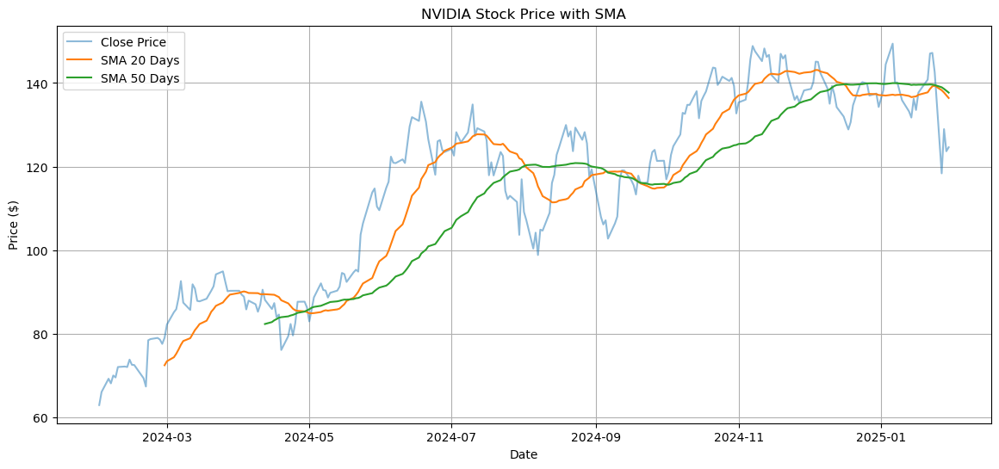

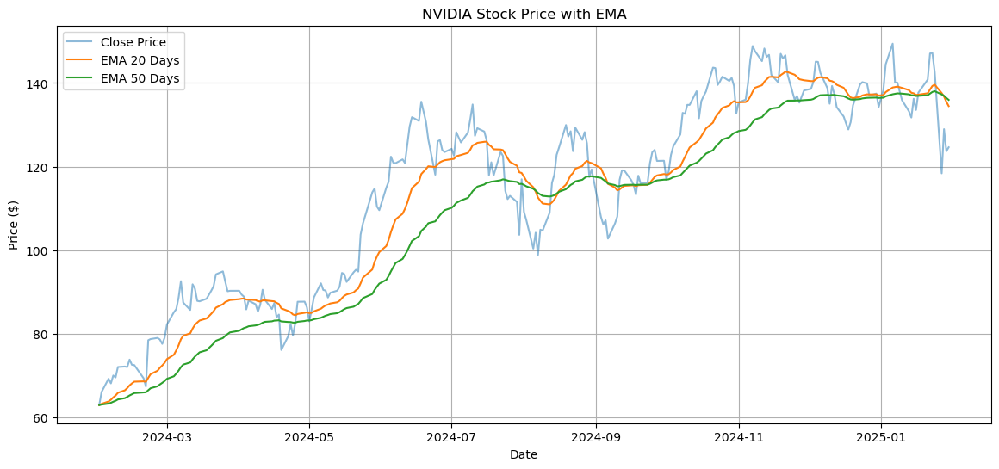

In [11]:
# Download NVIDIA stock data
nvda = yf.download("NVDA", start="2024-02-01", end="2025-01-31")

# Calculate SMA and EMA
nvda['SMA_20'] = nvda['Close'].rolling(window=20).mean()
nvda['SMA_50'] = nvda['Close'].rolling(window=50).mean()
nvda['EMA_20'] = nvda['Close'].ewm(span=20, adjust=False).mean()
nvda['EMA_50'] = nvda['Close'].ewm(span=50, adjust=False).mean()

#Plot SMA
plt.figure(figsize=(14, 6))
plt.plot(nvda['Close'], label='Close Price', alpha=0.5)
plt.plot(nvda['SMA_20'], label='SMA 20 Days')
plt.plot(nvda['SMA_50'], label='SMA 50 Days')
plt.title("NVIDIA Stock Price with SMA")
plt.xlabel("Date")
plt.ylabel("Price ($)")
plt.legend()
plt.grid(True)
plt.show()

# Plot EMA
plt.figure(figsize=(14, 6))
plt.plot(nvda['Close'], label='Close Price', alpha=0.5)
plt.plot(nvda['EMA_20'], label='EMA 20 Days')
plt.plot(nvda['EMA_50'], label='EMA 50 Days')
plt.title("NVIDIA Stock Price with EMA")
plt.xlabel("Date")
plt.ylabel("Price ($)")
plt.legend()
plt.grid(True)
plt.show()

FB Prophet

This code prepares NVIDIA stock data for **time series forecasting using Facebook Prophet**. It starts by downloading historical stock prices from Yahoo Finance (from January 1, 2010 to December 31, 2024). The closing prices are extracted and converted to a DataFrame, renaming the column to `'y'`, which is the format Prophet expects. The date index is reset and stored in a new column called `'ds'` (for datestamp), again aligning with Prophet’s required input format. Finally, the columns are reordered to place `'ds'` first and `'y'` second, and the last few rows of the cleaned DataFrame are displayed. This setup is essential before fitting a Prophet model.


In [12]:
# Download NVDA historical stock data
nvda = yf.download('NVDA', start='2010-01-01', end='2024-12-31')

# Prepare data in Prophet format
# Access the 'Close' price data using the multi-level index
close_prices = nvda['Close']['NVDA']

# Convert the Series to a DataFrame and rename the column to 'y'
df = close_prices.to_frame(name='y')

# Add the 'Date' index as a column named 'ds' and reset the index
df['ds'] = df.index
df = df.reset_index(drop=True)

# Reorder columns to have 'ds' first
df = df[['ds', 'y']]

# Display last few rows
display(df.tail())

C:\Users\DELL\AppData\Local\Temp\ipykernel_14072\3194631390.py:2: FutureWarning: YF.download() has changed argument auto_adjust default to True
  nvda = yf.download('NVDA', start='2010-01-01', end='2024-12-31')
[*********************100%***********************]  1 of 1 completed


,ds,y
3768,2024-12-23,139.647446
3769,2024-12-24,140.197372
3770,2024-12-26,139.907410
3771,2024-12-27,136.987869
3772,2024-12-30,137.467804


df.info() provides a concise summary including the number of entries, column names, non-null values, and memory usage.

df.dtypes shows the data types of each column, ensuring that 'ds' is in datetime64 format and 'y' is numeric — both required by Prophet.

In [13]:
# Inspect the DataFrame before fitting the model
display(df.info())
display(df.dtypes)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3773 entries, 0 to 3772
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      3773 non-null   datetime64[ns]
 1   y       3773 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 59.1 KB


None

ds    datetime64[ns]
y            float64
dtype: object

This creates a DataFrame with future dates for the next 365 days beyond your existing dataset.

Prophet needs this future date range to predict values.

In [14]:
model = Prophet()
model.fit(df)

21:29:02 - cmdstanpy - INFO - Chain [1] start processing
21:29:05 - cmdstanpy - INFO - Chain [1] done processing


In [15]:
future = model.make_future_dataframe(periods=365)
future.tail()

,ds
4133,2025-12-26
4134,2025-12-27
4135,2025-12-28
4136,2025-12-29
4137,2025-12-30


In [16]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
4133,2025-12-26,148.948788,135.447433,162.451819
4134,2025-12-27,149.094493,136.223441,161.071366
4135,2025-12-28,149.117613,135.845296,162.169793
4136,2025-12-29,149.209079,136.512631,161.935423
4137,2025-12-30,149.083031,136.597550,162.151435


This plots the forecasted stock prices along with:

Historical data (blue dots/line)

Forecast line (yhat)

Shaded area showing uncertainty intervals (yhat_lower and yhat_upper)

fig1 holds the plot object in case you want to customize it later.



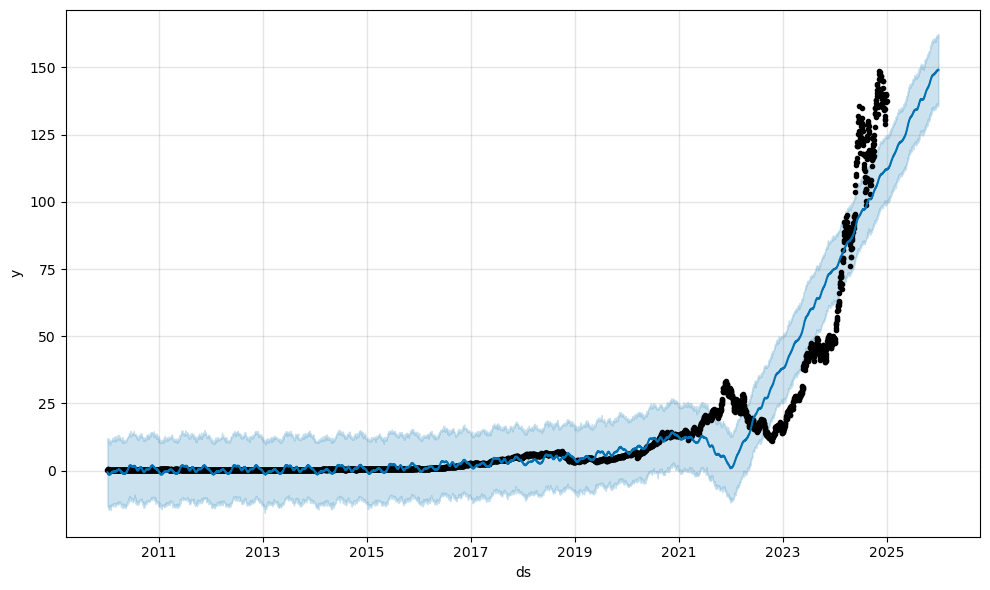

In [17]:
fig1 = model.plot(forecast)

This line generates a set of subplots that break down the forecast into its components, helping you understand what’s driving the predictions made by the Prophet model.

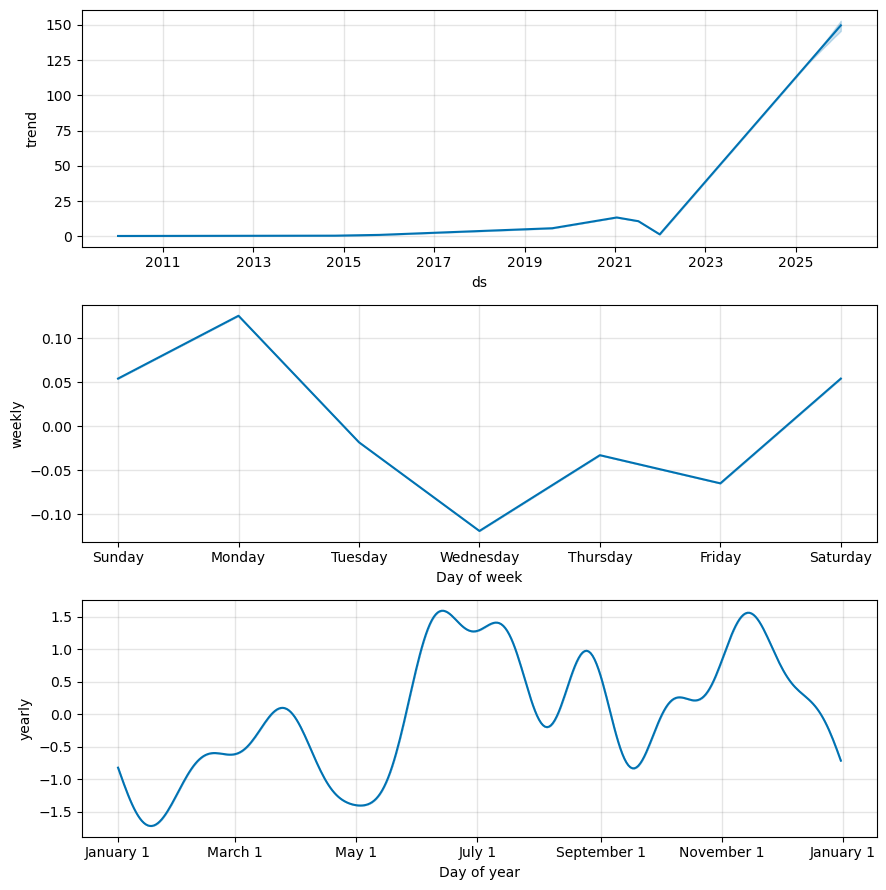

In [18]:
fig2 = model.plot_components(forecast)

The code `plot_plotly(model, forecast)` generates an interactive forecast plot using Plotly, allowing you to explore NVIDIA’s stock price predictions visually. It displays historical data as black dots, the predicted future values as a blue line, and shaded areas representing the uncertainty intervals (upper and lower bounds). Unlike static Matplotlib plots, this Plotly version lets you zoom, hover, and explore details, making it highly useful for presentations or detailed analysis. It's especially helpful to see how confident the model is in its predictions over time.


In [19]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model, forecast)

The `plot_components_plotly(model, forecast)` function creates an interactive visualization that breaks down the forecast into its individual components. It typically shows the **trend**, **yearly seasonality**, and **weekly seasonality** identified by the Prophet model. Each component helps explain how different patterns in the data influence the prediction. Since it’s built with Plotly, you can hover over data points, zoom in, and explore trends interactively, making it easier to interpret how each factor contributes to the stock price forecast.


In [20]:
plot_components_plotly(model, forecast)